In [1]:
# libs
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.transform import rescale
import skimage.color as color

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# !aws s3api get-object --bucket spacenet-dataset \
#     --key AOI_1_Rio/processedData/processedBuildingLabels.tar.gz \
#     --request-payer requester processedBuildingLabels.tar.gz

In [4]:
#  ! pip install -q kaggle

In [5]:
# from google.colab import files
# files.upload()

In [6]:
%cd /content/drive/MyDrive/dataset/sample

/content/drive/MyDrive/dataset/sample


In [7]:
#  ! mkdir .kaggle

In [8]:
# ! cp kaggle.json .kaggle/

In [9]:
#  ! chmod 600 .kaggle/kaggle.json

In [10]:
# !mv .kaggle /root/

In [11]:
# !kaggle datasets list

In [12]:
# !kaggle competitions download -c dstl-satellite-imagery-feature-detection

In [13]:
# %cd input

In [14]:
# !unzip /content/drive/MyDrive/dataset/train_geojson_v3.zip

In [15]:
# !unzip /content/drive/MyDrive/dataset/a.zip

In [16]:
%cd dataset_lansat8

/content/drive/MyDrive/dataset/sample/dataset_lansat8


In [17]:
# !unzip /content/drive/MyDrive/dataset/sample/dataset_lansat8.zip

In [18]:
# libs
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.transform import rescale
import skimage.color as color

#Read Imges

**read multiple images**

In [19]:
# import os

# root_path = 'sixteen_band'
# ids_path = os.listdir(root_path)

# print(len(ids_path))
# set_id = []
# for i, id in enumerate(ids_path):
#   if '_M.tif' in id:
#     set_id.append(id.replace('_M.tif', ''))
#   # image_path = os.join(root_path, id)

# set_m = []
# set_pan = []
# for IM_ID in set_id:
#   # read m and p data
#   try:
#     m = tiff.imread('sixteen_band/{}_M.tif'.format(IM_ID))
#     pan = tiff.imread('sixteen_band/{}_P.tif'.format(IM_ID))
#   except:
#     continue
#   set_m.append(m)
#   set_pan.append(pan)

# print ('m_shape: ', set_m[0].shape)
# print ('pan_shape: ', set_pan[0].shape)

In [20]:
import os

def ret_tif(root_path):

  ids_path = os.listdir(root_path)

  set = []
  for i, nf in enumerate(ids_path):
    if '.tif' in nf:
      m = tiff.imread(os.path.join(root_path, nf))
      set.append(m)
  return set

nir_set = ret_tif('nir')
green_set = ret_tif('green')
blue_set = ret_tif('blue')
red_set = ret_tif('red')
pan_set = ret_tif('pan')


In [21]:
red_set[169].shape

(512, 512)

In [22]:
m_set = []

size = len(nir_set)
for i in range(size):
  if red_set[i].shape[0] == 512 and red_set[i].shape[1] == 512:
    m = np.zeros((8,512, 512))
    m[4,:,:] = red_set[i] # red
    m[2,:,:] = green_set[i] # green
    m[1,:,:] = blue_set[i] # blue
    m[6,:,:] = nir_set[i] # NIR-1

    m_set.append(m)

**read one image**

In [23]:
# import os
# r = tiff.imread('red/red.138.tif')
# g = tiff.imread('green/green.138.tif')
# b = tiff.imread('blue/blue.138.tif')
# nir = tiff.imread('NIR/NIR.138.tif')
# pan = tiff.imread('pan/pan.138.tif')



# print ('red_shape: ', r.shape)
# print ('green_shape: ', g.shape)
# print ('blue_shape: ', b.shape)
# print ('nir_shape: ', nir.shape)
# print ('pan_shape: ', pan.shape)


#Define Function

In [24]:
# functions 
def stretch(bands, lower_percent=2, higher_percent=98):
    out = np.zeros_like(bands)
    for i in range(3):
        a = 0 
        b = 255 
        c = np.percentile(bands[:,:,i], lower_percent)
        d = np.percentile(bands[:,:,i], higher_percent)        
        t = a + (bands[:,:,i] - c) * (b - a) / (d - c)    
        t[t<a] = a
        t[t>b] = b
        out[:,:,i] =t
    return out.astype(np.uint8)

def pansharpen(m, pan, method='browley', W=0.1, all_data=False):
    
    # get m_bands
    rgbn = np.empty((m.shape[1], m.shape[2], 4)) 
    rgbn[:,:,0] = m[4,:,:] # red
    rgbn[:,:,1] = m[2,:,:] # green
    rgbn[:,:,2] = m[1,:,:] # blue
    rgbn[:,:,3] = m[6,:,:] # NIR-1
    
    # scaled them
    rgbn_scaled = np.empty((m.shape[1]*2, m.shape[2]*2, 4))

    for i in range(4):
        img = rgbn[:,:,i]
        scaled = rescale(img, (2,2))
        rgbn_scaled[:,:,i] = scaled
    
    # check size and crop for pan band
    if pan.shape[0] < rgbn_scaled.shape[0]:
        rgbn_scaled = rgbn_scaled[:pan.shape[0],:, :]
    else:
        pan = pan[:rgbn_scaled.shape[0], :]
        
    if pan.shape[1] < rgbn_scaled.shape[1]:
        rgbn_scaled = rgbn_scaled[:,:pan.shape[1], :]
    else:
        pan = pan[:,:rgbn_scaled.shape[1]]

    R = rgbn_scaled[:,:,0]
    G = rgbn_scaled[:,:,1]
    B = rgbn_scaled[:,:,2]
    I = rgbn_scaled[:,:,3]

    image = None

    if method == 'simple_browley':
        all_in = R+G+B
        prod = np.multiply(all_in, pan)

        r = np.multiply(R, pan/all_in)[:, :, np.newaxis]
        g = np.multiply(G, pan/all_in)[:, :, np.newaxis]
        b = np.multiply(B, pan/all_in)[:, :, np.newaxis]

        image = np.concatenate([r,g,b], axis=2)
    
    if method == 'sample_mean':
        r = 0.5 * (R + pan)[:, :, np.newaxis]
        g = 0.5 * (G + pan)[:, :, np.newaxis]
        b = 0.5 * (B + pan)[:, :, np.newaxis]
        
        image = np.concatenate([r,g,b], axis=2)
        
    if method == 'esri':
        ADJ = pan-rgbn_scaled.mean(axis=2) 
        r = (R + ADJ)[:, :, np.newaxis]
        g = (G + ADJ)[:, :, np.newaxis]
        b = (B + ADJ)[:, :, np.newaxis]
        i = (I + ADJ)[:, :, np.newaxis]
        
        image = np.concatenate([r,g,b,i], axis=2)
    
    if method == 'browley':
        DNF = (pan - W*I)/(W*R+W*G+W*B)

        r = (R * DNF)[:, :, np.newaxis]
        g = (G * DNF)[:, :, np.newaxis]
        b = (B * DNF)[:, :, np.newaxis]
        i = (I * DNF)[:, :, np.newaxis]

        image = np.concatenate([r,g,b,i], axis=2)
    
    if method == 'hsv':
        hsv = color.rgb2hsv(rgbn_scaled[:,:,:3])
        hsv[:,:,2] = pan - I*W
        image = color.hsv2rgb(hsv)
        
    if all_data:
        return rgbn_scaled, image, I
    else:
        return image

**for one image**

In [25]:
# m = np.zeros((8,512, 512))
# m[4,:,:] = r # red
# m[2,:,:] = g # green
# m[1,:,:] = b # blue
# m[6,:,:] = nir # NIR-1

In [26]:
# len(set_m)

#Process on Image

**multiple file**

In [30]:
rgbn_l = []
sharpen_l = []
for m, pan in zip(m_set[20:60], pan_set[20:60]):

  rgbn, sharpened_browley_simple, I = pansharpen(m, pan, method='simple_browley', all_data=True)
  # sharpened_mean = pansharpen(m, pan, method='sample_mean')
  # sharpened_esri = pansharpen(m, pan, method='esri')

  # sharpened_browley2 = pansharpen(m, pan, W=0.1)
  # sharpened_browley4 = pansharpen(m, pan, W=0.2)
  # sharpened_browley6 = pansharpen(m, pan, W=0.3)
  # sharpened_browley8 = pansharpen(m, pan, W=0.4)

  sharpened_ihs2 = pansharpen(m, pan, method='hsv', W=0.1)
  # sharpened_ihs4 = pansharpen(m, pan, method='hsv', W=0.2)
  # sharpened_ihs6 = pansharpen(m, pan, method='hsv', W=0.3)
  # sharpened_ihs8 = pansharpen(m, pan, method='hsv', W=0.4)

  rgbn_l.append(rgbn)# rgbn_l = []
# sharpen_l = []
# for m, pan in zip(set_m[60:], set_pan[60:]):

#   rgbn, sharpened_browley_simple, I = pansharpen(m, pan, method='simple_browley', all_data=True)
#   # sharpened_mean = pansharpen(m, pan, method='sample_mean')
#   # sharpened_esri = pansharpen(m, pan, method='esri')

#   # sharpened_browley2 = pansharpen(m, pan, W=0.1)
#   # sharpened_browley4 = pansharpen(m, pan, W=0.2)
#   # sharpened_browley6 = pansharpen(m, pan, W=0.3)
#   # sharpened_browley8 = pansharpen(m, pan, W=0.4)

#   sharpened_ihs2 = pansharpen(m, pan, method='hsv', W=0.1)
#   # sharpened_ihs4 = pansharpen(m, pan, method='hsv', W=0.2)
#   # sharpened_ihs6 = pansharpen(m, pan, method='hsv', W=0.3)
#   # sharpened_ihs8 = pansharpen(m, pan, method='hsv', W=0.4)

#   rgbn_l.append(rgbn)
#   sharpen_l.append(sharpened_ihs2)
  sharpen_l.append(sharpened_ihs2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in multiply
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in multiply
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in multiply
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-

**process on one file**

In [28]:
%cd final_dataset

/content/drive/My Drive/dataset/sample/dataset_lansat8/final_dataset


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


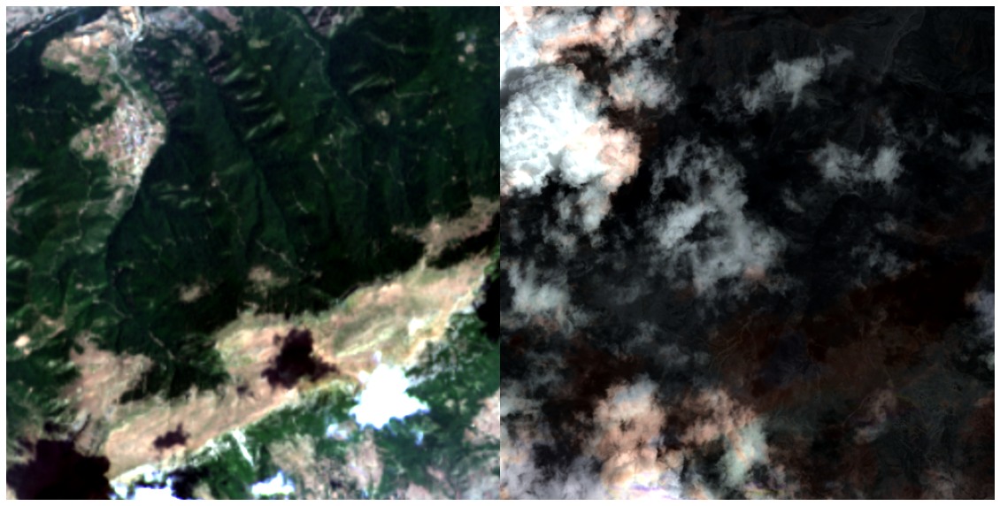

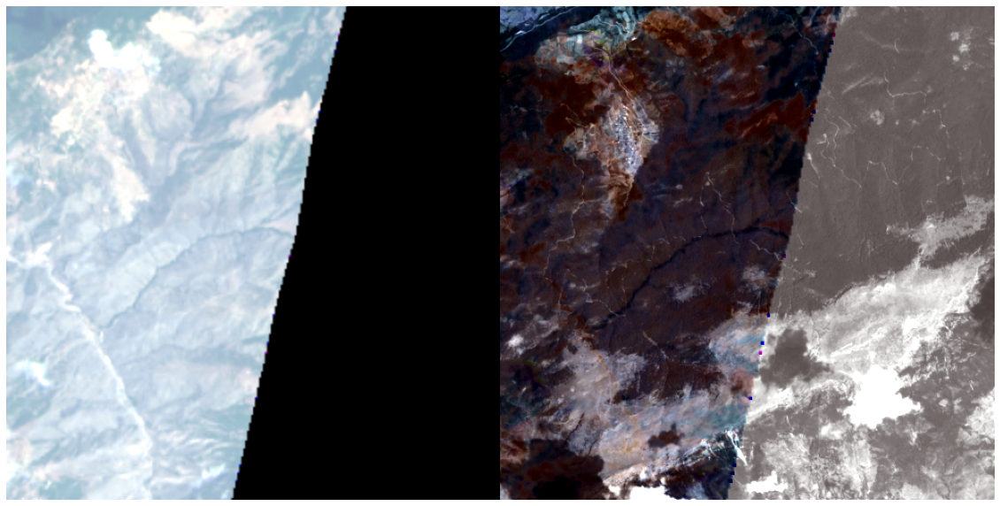

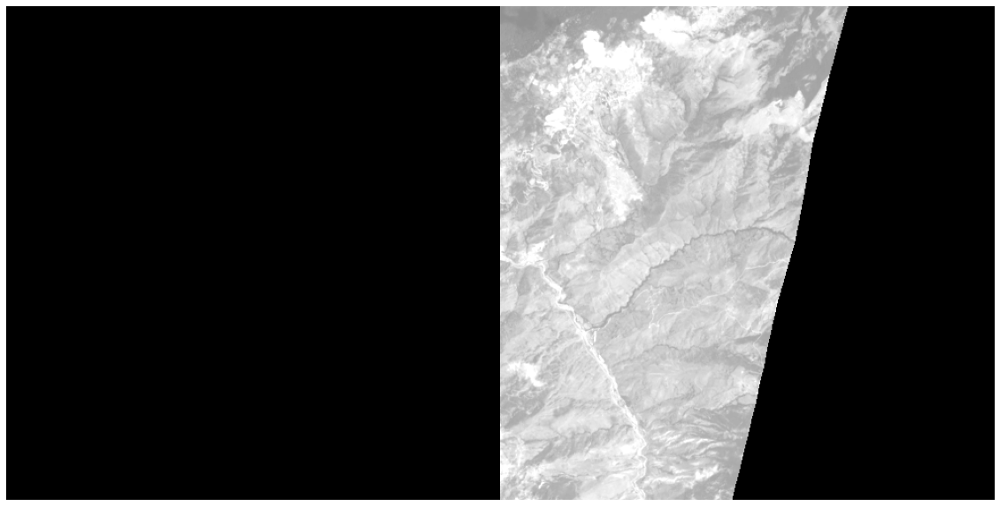

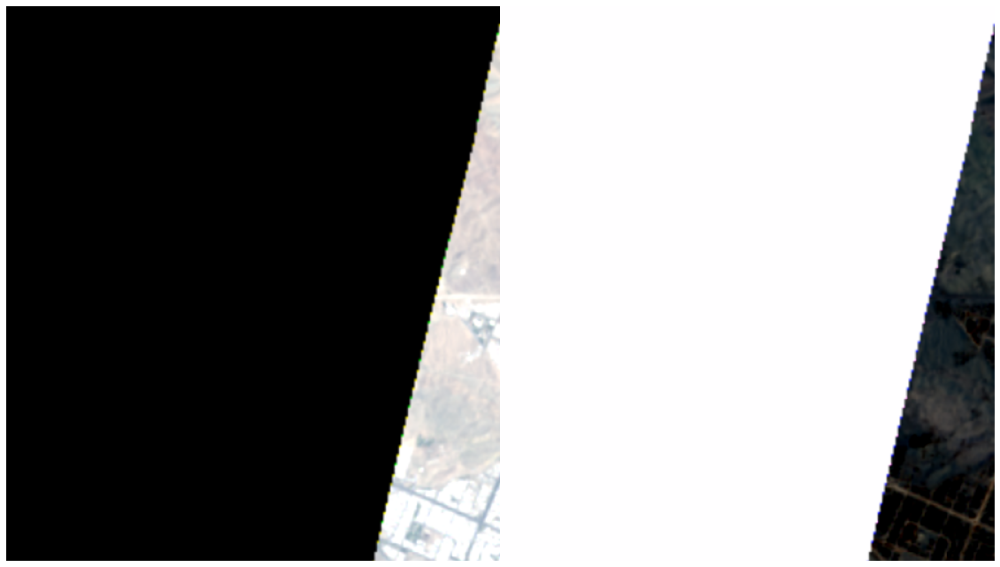

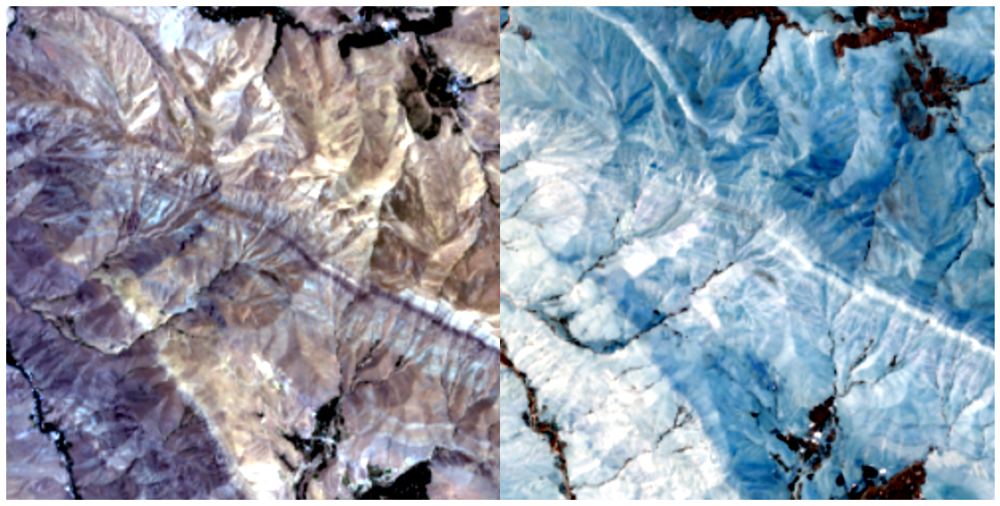

...

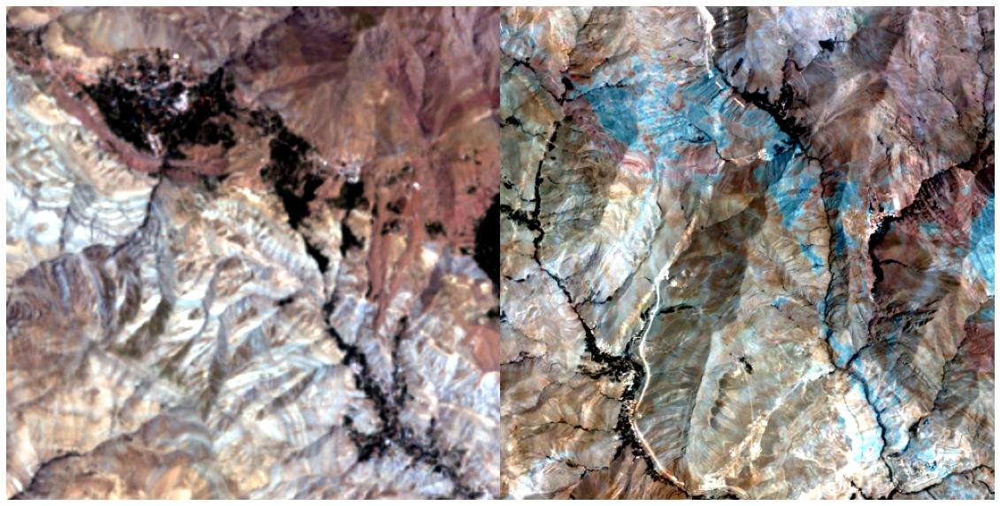

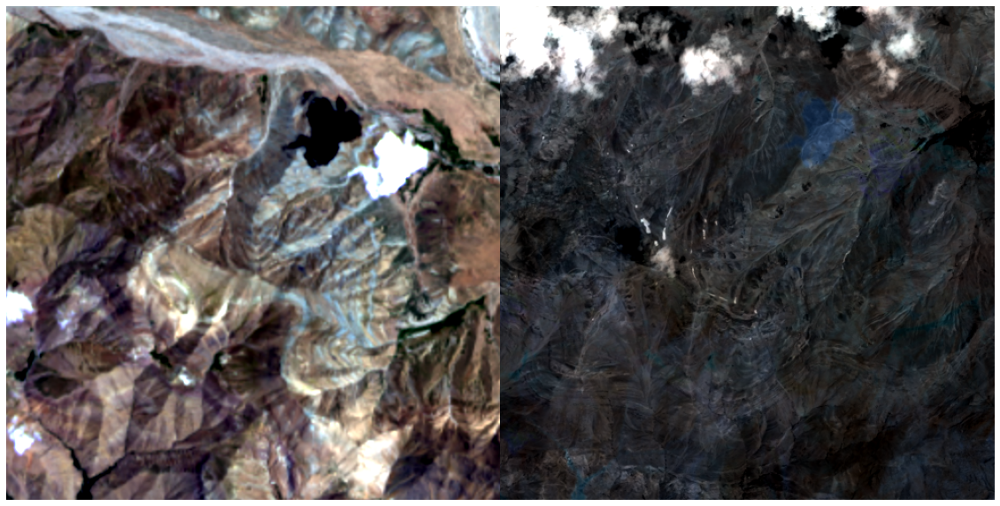

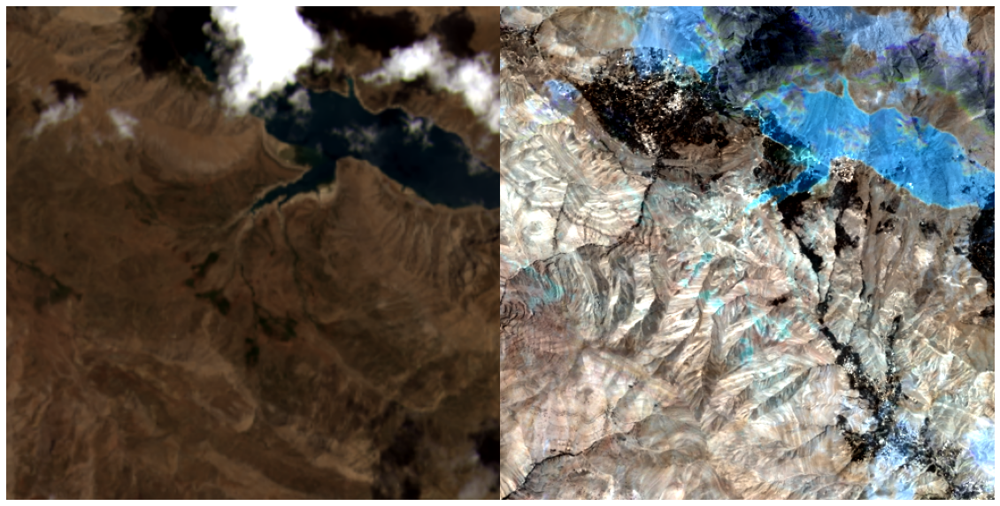

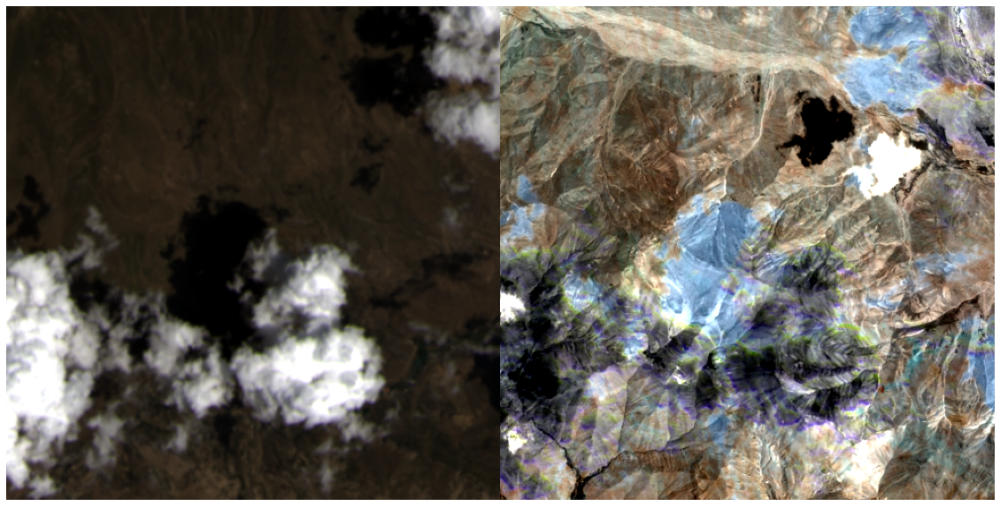

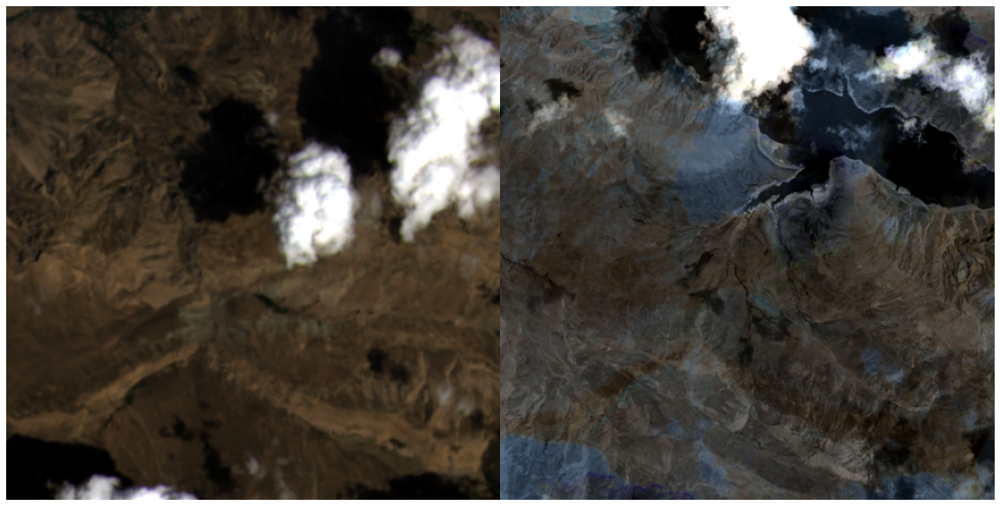

In [ ]:
i = 20
for rgbn, sharpened_ihs2 in zip(rgbn_l, sharpen_l):
  fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(20, 20))
  # axes.axis("off")
  input = stretch(rgbn[500:1000,500:1000,:3])
  axes[0].imshow(input)
  axes[0].axis("off")
  axes[0].set_xticklabels([])
  target = stretch(sharpened_ihs2[500:1000,500:1000,:3])
  axes[1].imshow(target)
  axes[1].axis("off")
  axes[1].set_xticklabels([])
  fig.subplots_adjust(wspace=0, hspace=0)
  fig.savefig('{}.jpg'.format(i),bbox_inches='tight',pad_inches = 0)
  i+=1
plt.show()

In [50]:
sharpened_ihs2.shape


(1024, 1024, 3)

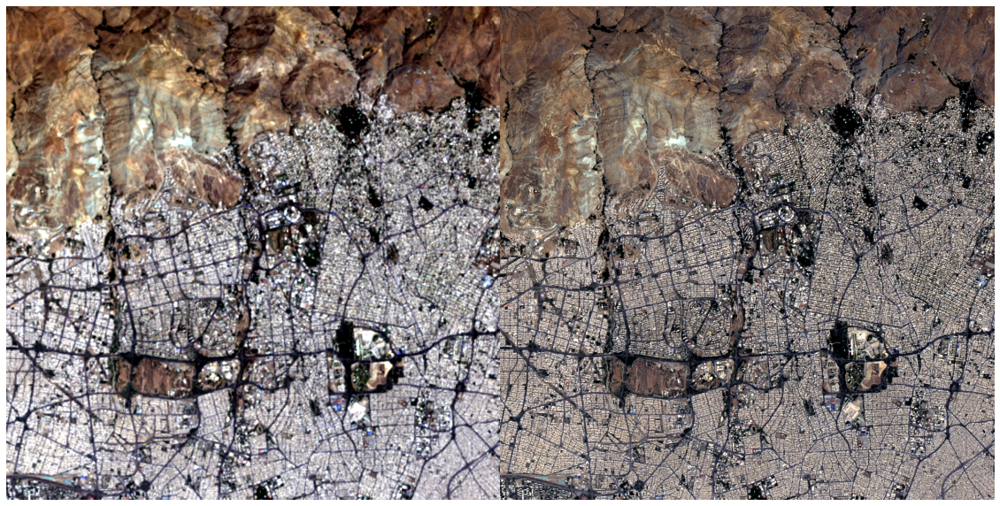

In [51]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(20, 20))
# axes.axis("off")
input = stretch(rgbn[:,:,:3])
axes[0].imshow(input)
axes[0].axis("off")
axes[0].set_xticklabels([])
target = stretch(sharpened_ihs2[:,:,:3])
axes[1].imshow(target)
axes[1].axis("off")
axes[1].set_xticklabels([])
fig.subplots_adjust(wspace=0, hspace=0)
fig.savefig('{}.jpg'.format(1000),bbox_inches='tight',pad_inches = 0)
plt.show()

In [ ]:
%cd ..

In [ ]:
import cv2

In [ ]:
i = 60
for rgbn, sharpened_ihs2 in zip(rgbn_l, sharpen_l):
  fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(20, 20))
  # axes.axis("off")
  input = stretch(rgbn[500:1000,500:1000,:3])
  axes[0].imshow(input)
  axes[0].axis("off")
  axes[0].set_xticklabels([])
  target = stretch(sharpened_ihs2[500:1000,500:1000,:3])
  axes[1].imshow(target)
  axes[1].axis("off")
  axes[1].set_xticklabels([])
  fig.subplots_adjust(wspace=0, hspace=0)
  fig.savefig('{}.jpg'.format(i),bbox_inches='tight',pad_inches = 0)
  i+=1
  plt.show()

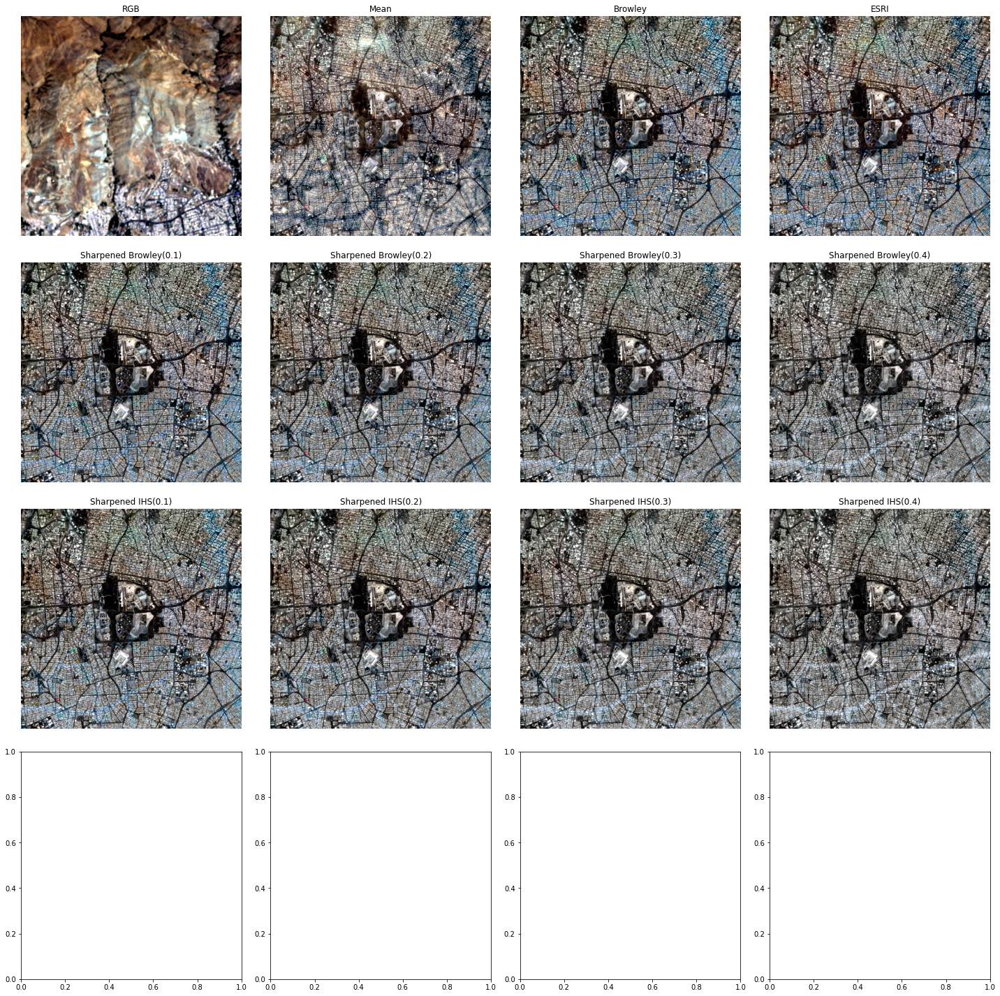

In [43]:
fig, axes = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = axes.ravel()

# no IR sharpening
ax[0].imshow(stretch(rgbn[500:1000,500:1000,:3]))
# cv2.imwrite('input.jpg', stretch(rgbn[500:1000,500:1000,:3]))
ax[0].set_title('RGB')
ax[0].axis('off')
ax[1].imshow(stretch(sharpened_mean[500:1000,500:1000,:]))
ax[1].set_title('Mean')    
ax[1].axis('off')
ax[2].imshow(stretch(sharpened_browley_simple[500:1000,500:1000,:]))
ax[2].set_title('Browley')
ax[2].axis('off')
ax[3].imshow(stretch(sharpened_esri[500:1000,500:1000,:3]))
ax[3].set_title('ESRI')
ax[3].axis('off')

# IR Browley
ax[4].imshow(stretch(sharpened_browley2[500:1000,500:1000,:3]))
ax[4].set_title('Sharpened Browley(0.1)')
ax[4].axis('off')
ax[5].imshow(stretch(sharpened_browley4[500:1000,500:1000,:3]))
ax[5].set_title('Sharpened Browley(0.2)')
ax[5].axis('off')
ax[6].imshow(stretch(sharpened_browley6[500:1000,500:1000,:3]))
ax[6].set_title('Sharpened Browley(0.3)')
ax[6].axis('off')
ax[7].imshow(stretch(sharpened_browley8[500:1000,500:1000,:3]))
ax[7].set_title('Sharpened Browley(0.4)')
ax[7].axis('off')

# IR HSV
ax[8].imshow(stretch(sharpened_ihs2[500:1000,500:1000,:3]))
# cv2.imwrite('target.jpg', stretch(sharpened_ihs2[500:1000,500:1000,:3]))
ax[8].set_title('Sharpened IHS(0.1)')
ax[8].axis('off')
ax[9].imshow(stretch(sharpened_ihs4[500:1000,500:1000,:3]))
ax[9].set_title('Sharpened IHS(0.2)')
ax[9].axis('off')
ax[10].imshow(stretch(sharpened_ihs6[500:1000,500:1000,:3]))
ax[10].set_title('Sharpened IHS(0.3)')
ax[10].axis('off')
ax[11].imshow(stretch(sharpened_ihs8[500:1000,500:1000,:3]))
ax[11].set_title('Sharpened IHS(0.4)')
ax[11].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
x = cv2.imread('target.jpg')
x = cv2.cvtColor(x, cv2.COLOR_HSV2RGB)
plt.imshow(x)